In [5]:
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.6.10) on 2022-03-02 16:41.


In [6]:
import loompy
print(loompy.__version__)

3.0.6


In [7]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [10]:
#previous rnaseq analysis
adata = scv.read('ep15_p1scrnaseq.h5ad', cache=True)

In [11]:
#merging loom with previous scrnaseq analysis

ldata = scv.read('run_count_E16IUEP1.loom', cache=True)
adata = scv.utils.merge(adata, ldata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
#loading rna-seq/rna velocity
adata = scv.read('scrnaseq_rna_velocity.h5ad', cache=True)

In [12]:
adata.var_names_make_unique()

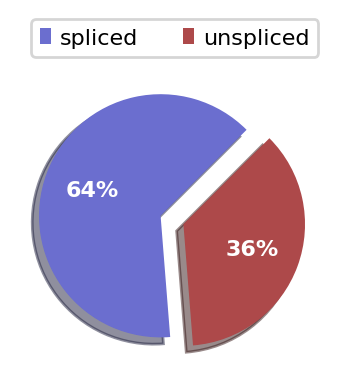

In [13]:
scv.pl.proportions(adata)

In [14]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 348 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:08) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [15]:
scv.tl.velocity(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [16]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/24 cores)


  0%|          | 0/10039 [00:00<?, ?cells/s]

    finished (0:00:20) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [17]:
adata

AnnData object with n_obs × n_vars = 10039 × 1275
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

In [18]:
import numpy as np
import pandas as pd
import scanpy as sc

In [19]:
sc.tl.pca(adata, svd_solver='arpack')

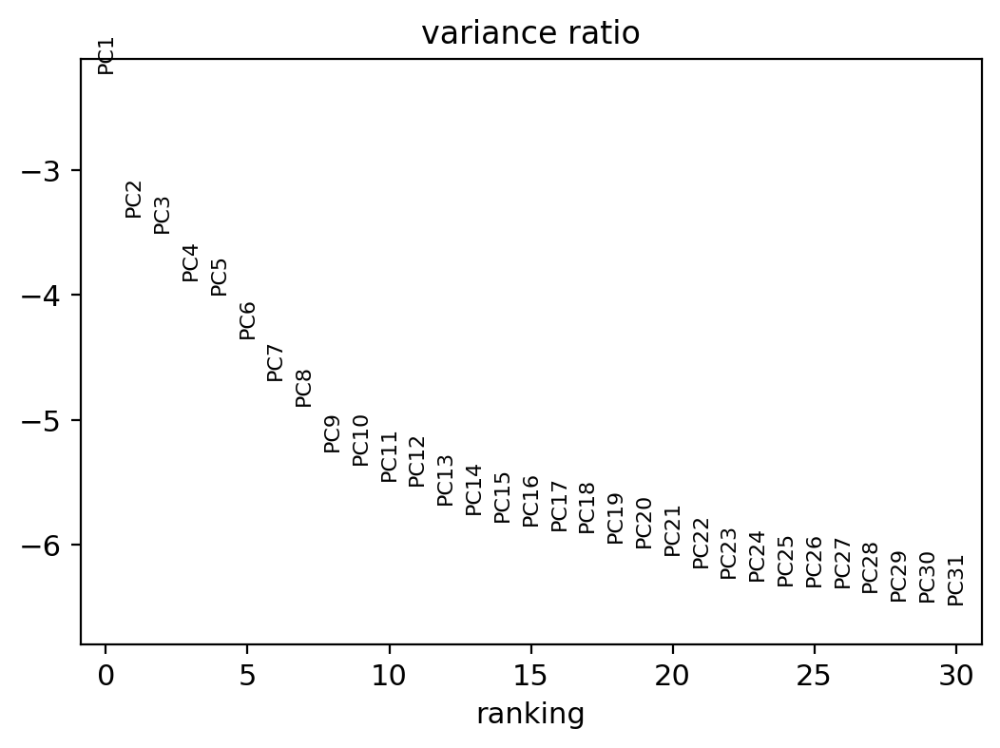

In [20]:
sc.pl.pca_variance_ratio(adata, log=True)

In [21]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

In [22]:
sc.tl.tsne(adata)

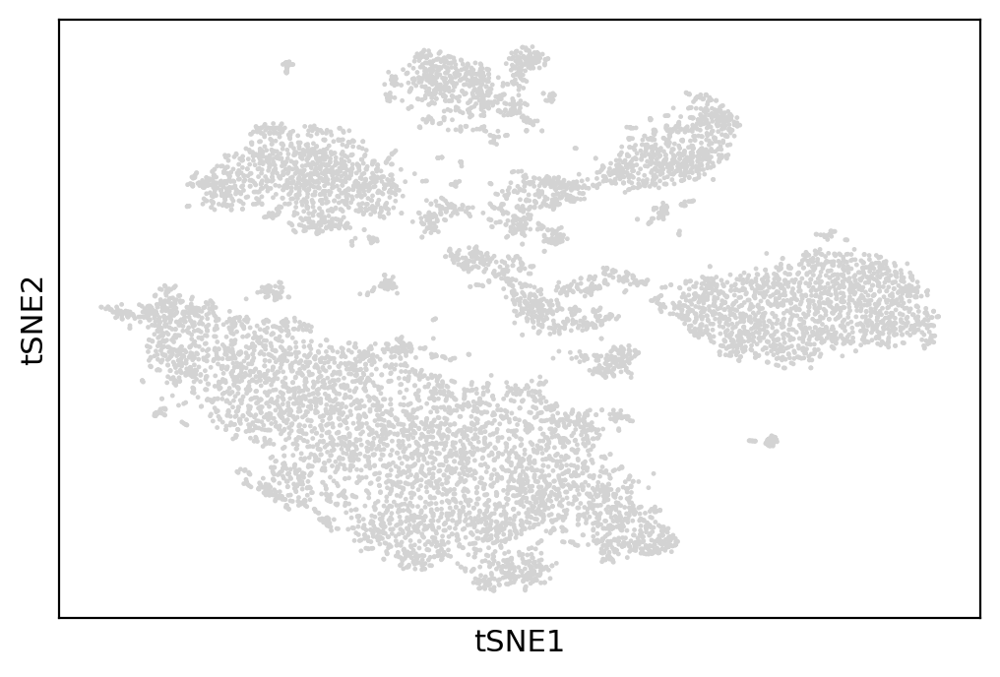

In [23]:
sc.pl.tsne(adata)

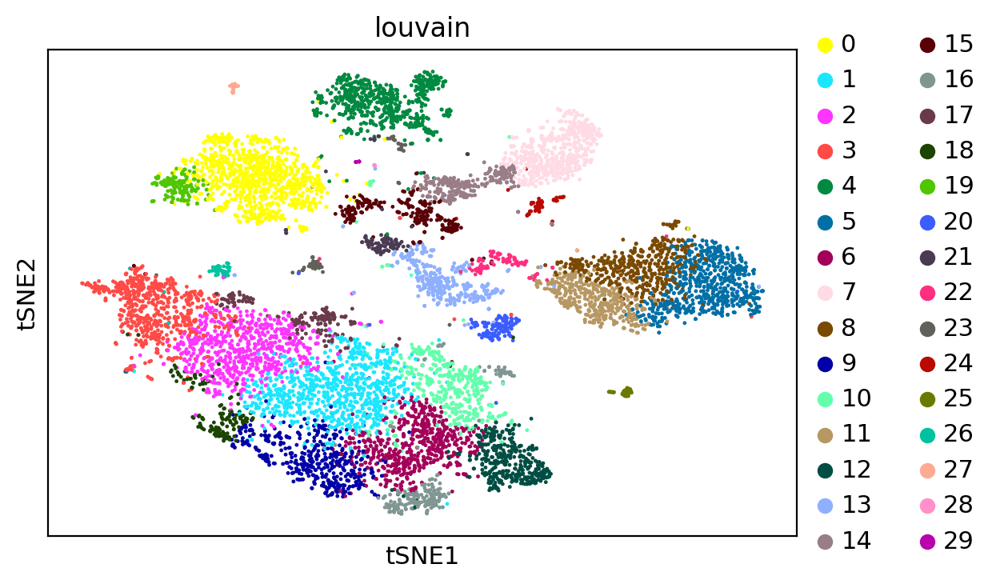

In [128]:
sc.tl.louvain(adata, resolution = 1.9)
sc.pl.tsne(adata, color=['louvain'])

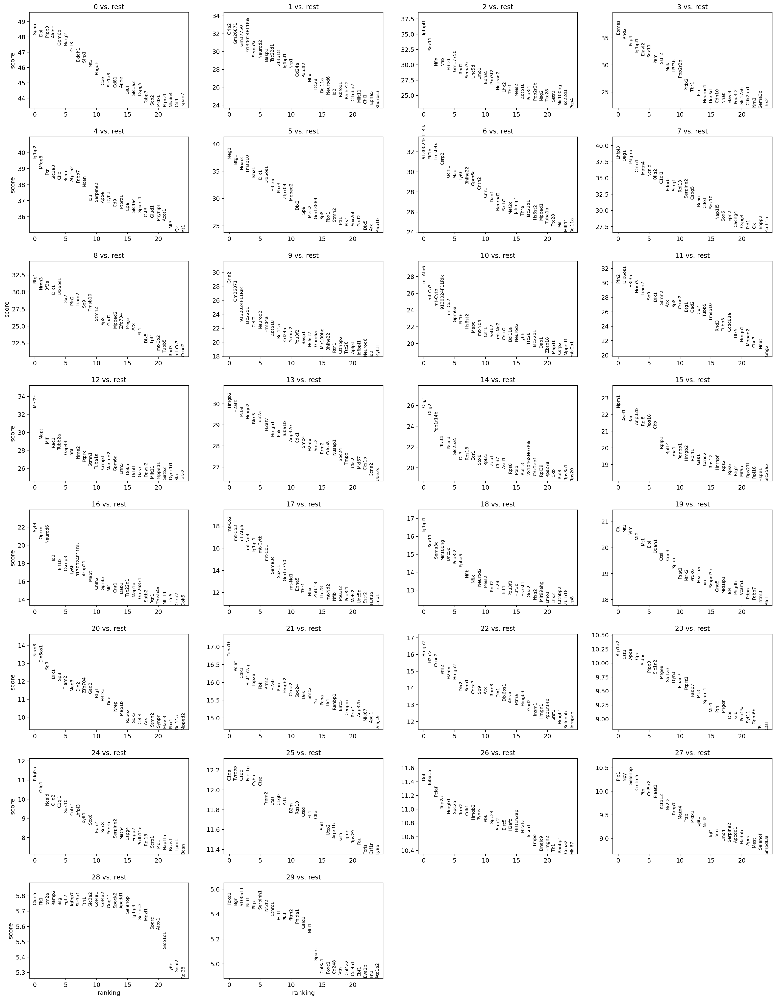

In [108]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [109]:
adata.uns

OverloadedDict, wrapping:
	{'hvg': {'flavor': 'seurat'}, 'leiden': {'params': {'resolution': 1.4, 'random_state': 0, 'n_iterations': -1}}, 'leiden_colors': ['#FFFF00', '#1CE6FF', '#FF34FF', '#FF4A46', '#008941', '#006FA6', '#A30059', '#FFDBE5', '#7A4900', '#0000A6', '#63FFAC', '#B79762', '#004D43', '#8FB0FF', '#997D87', '#5A0007', '#809693', '#6A3A4C', '#1B4400', '#4FC601', '#3B5DFF', '#4A3B53', '#FF2F80', '#61615A', '#BA0900', '#6B7900', '#00C2A0', '#FFAA92', '#FF90C9'], 'neighbors': {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'n_neighbors': 10, 'method': 'umap', 'random_state': 0, 'metric': 'euclidean', 'n_pcs': 30}}, 'pca': {'params': {'zero_center': True, 'use_highly_variable': True}, 'variance': array([131.79283  ,  41.799217 ,  36.727943 ,  25.113888 ,  22.412508 ,
        15.797694 ,  11.330675 ,   9.193198 ,   6.4052815,   5.7499766,
         5.0566516,   4.877301 ,   4.1766157,   3.8797126,   3.639178 ,
         3.5277205,   3.4036684,   3

In [110]:
adata.uns['rank_genes_groups'] #data output from rank genes

{'params': {'groupby': 'louvain',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('Sparc', 'Gria2', 'Igfbpl1', 'Eomes', 'Igfbp2', 'Meg3', '9130024F11Rik', 'Lhfpl3', 'Btg1', 'Gria2', 'mt-Atp6', 'Pfn2', 'Mef2c', 'Hmgb2', 'Olig1', 'Npm1', 'Syt4', 'mt-Co2', 'Igfbpl1', 'Clu', 'Nrxn3', 'Tuba1b', 'Hmgn2', 'Atp1a2', 'Pdgfra', 'C1qa', 'Dut', 'Plp1', 'Cldn5', 'Foxd1'),
            ('Dbi', 'Gm26871', 'Sox11', 'Rnd2', 'Mfge8', 'Btg1', 'Eif1b', 'Olig1', 'Nrxn3', 'Gm26871', 'mt-Co3', 'Dlx6os1', 'Mapt', 'H2afz', 'Olig2', 'Ascl1', 'Opcml', 'mt-Co3', 'Sox11', 'Mt3', 'Dlx6os1', 'Pclaf', 'H2afz', 'Cst3', 'Olig1', 'Tyrobp', 'Tuba1b', 'Npy', 'Flt1', 'Bgn'),
            ('Plpp3', 'Gm17750', 'Nfix', 'Pcp4', 'Ptn', 'Nrxn3', 'Tmsb4x', 'Pdgfra', 'H3f3a', '9130024F11Rik', 'mt-Cytb', 'H3f3a', 'Mif', 'Pclaf', 'Ppp1r14b', 'Ran', 'Neurod6', 'mt-Atp6', 'Sema3c', 'Vim', 'Sp9', 'Cdk1', 'Ccnd2', 'Apoe', 'Ncald', 'C1qc', 'Pcl

In [111]:
results = adata.uns['rank_genes_groups']

In [112]:
results['names']['0']

array(['Sparc', 'Dbi', 'Plpp3', ..., 'Hnrnpa1', 'Basp1', 'Tmsb10'],
      dtype=object)

In [113]:
results['names'].dtype.names

('0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29')

In [114]:
out = np.array([[0,0,0,0,0]]) #5 column array
for group in results['names'].dtype.names:
    out = np.vstack((out, np.vstack((results['names'][group],
                                     results['scores'][group],
                                     results['pvals_adj'][group],
                                     results['logfoldchanges'][group],
                                     np.array([group] * len(results['names'][group])).astype('object'))).T))



In [115]:
out.shape

(568681, 5)

In [116]:
markers = pd.DataFrame(out[1:], columns = ['Gene', 'scores', 'pval_adj', 'lfc', 'cluster'])

In [117]:
markers

,Gene,scores,pval_adj,lfc,cluster
0,Sparc,48.1673,0,6.05479,0
1,Dbi,48.0428,0,5.21159,0
2,Plpp3,47.9813,0,5.06208,0
3,Aldoc,47.9375,0,5.76087,0
4,Gpm6b,47.467,0,2.66183,0
...,...,...,...,...,...
568675,Gm1673,-5.08428,0.000368175,-4.27795,29
568676,Tuba1a,-5.13908,0.000290752,-3.22373,29
568677,Meis2,-5.17347,0.000256229,-33.167,29
568678,Tubb2b,-5.21419,0.000218735,-3.63932,29


In [118]:
markers = markers[(markers.pval_adj < 0.05) & (abs(markers.lfc) > 1)]

In [119]:
markers

,Gene,scores,pval_adj,lfc,cluster
0,Sparc,48.1673,0,6.05479,0
1,Dbi,48.0428,0,5.21159,0
2,Plpp3,47.9813,0,5.06208,0
3,Aldoc,47.9375,0,5.76087,0
4,Gpm6b,47.467,0,2.66183,0
...,...,...,...,...,...
568675,Gm1673,-5.08428,0.000368175,-4.27795,29
568676,Tuba1a,-5.13908,0.000290752,-3.22373,29
568677,Meis2,-5.17347,0.000256229,-33.167,29
568678,Tubb2b,-5.21419,0.000218735,-3.63932,29


In [120]:
markers.to_csv('scvelo_louvain_markers_res1.9.csv')

In [130]:
cluster_list = adata.obs.louvain.unique()
cluster_list

['11', '0', '15', '12', '2', ..., '24', '25', '27', '29', '28']
Length: 30
Categories (30, object): ['11', '0', '15', '12', ..., '25', '27', '29', '28']

In [131]:
# Make cluster anottation dictionary
annotation = {"RGC":[0],
              "Oligodendrocytes": [7, 24],
              "non-proliferative pre-OPCs": [14],
              "Astrocytes":[4],
              "OBiN":[5, 8, 11],
              "MIPC" :[15, 21],
              "PyN-IPC":[3],
              "Immature Neurons": [2],
              "proliferative PyN-IPC": [26],
              "OBiN-IPCs":[13, 22],
              "non-proliferative OBiN-IPC":[20],
             "Endothelial": [29, 28],
             "Ependymal": [19],
             "Microglia": [25], 
             "Neurons": [1, 17, 18, 9, 6, 10, 12, 16],
             "OL": [27],
             "cycling glia progenitors": [23]}

# Change dictionary format
annotation_rev = {}
for i in cluster_list:
    for k in annotation:
        if int(i) in annotation[k]:
            annotation_rev[i] = k

# Check dictionary
annotation_rev

{'11': 'OBiN',
 '0': 'RGC',
 '15': 'MIPC',
 '12': 'Neurons',
 '2': 'Immature Neurons',
 '1': 'Neurons',
 '9': 'Neurons',
 '6': 'Neurons',
 '4': 'Astrocytes',
 '3': 'PyN-IPC',
 '7': 'Oligodendrocytes',
 '22': 'OBiN-IPCs',
 '13': 'OBiN-IPCs',
 '5': 'OBiN',
 '8': 'OBiN',
 '16': 'Neurons',
 '17': 'Neurons',
 '10': 'Neurons',
 '14': 'non-proliferative pre-OPCs',
 '19': 'Ependymal',
 '26': 'proliferative PyN-IPC',
 '20': 'non-proliferative OBiN-IPC',
 '18': 'Neurons',
 '23': 'cycling glia progenitors',
 '21': 'MIPC',
 '24': 'Oligodendrocytes',
 '25': 'Microglia',
 '27': 'OL',
 '29': 'Endothelial',
 '28': 'Endothelial'}

In [132]:
adata.obs["cell_type"] = [annotation_rev[i] for i in adata.obs.louvain]

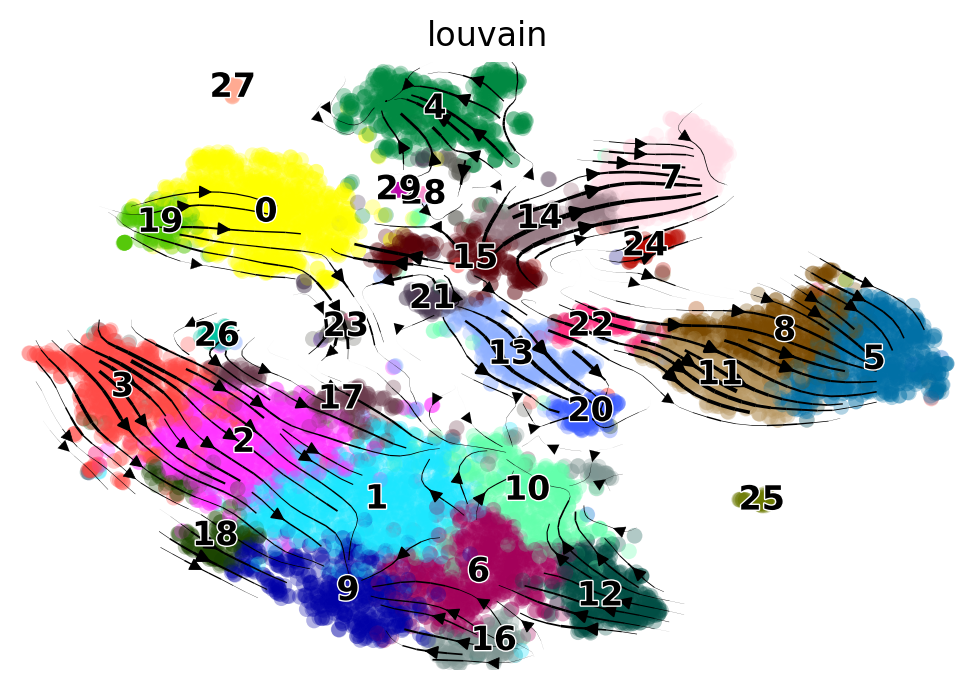

In [129]:
scv.pl.velocity_embedding_stream(adata, basis='tsne', color = 'louvain')

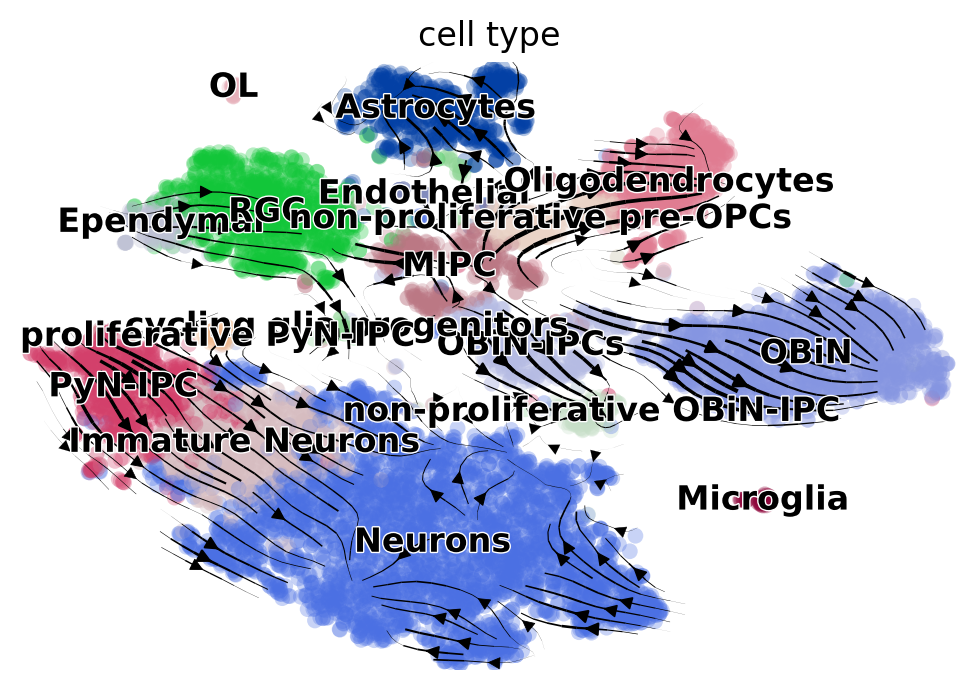

In [134]:
scv.pl.velocity_embedding_stream(adata, basis='tsne', color = 'cell_type', legend_loc='on data')

In [135]:
adata.obs.cell_type.unique()

['OBiN', 'RGC', 'MIPC', 'Neurons', 'Immature Neurons', ..., 'non-proliferative OBiN-IPC', 'cycling glia progenitors', 'Microglia', 'OL', 'Endothelial']
Length: 17
Categories (17, object): ['OBiN', 'RGC', 'MIPC', 'Neurons', ..., 'cycling glia progenitors', 'Microglia', 'OL', 'Endothelial']

In [136]:
cell_of_interest = adata.obs.index[~adata.obs.cell_type.isin(["Neurons", "Microglia", "Endothelial", "Ependymal"])]
adata = adata[cell_of_interest, :]

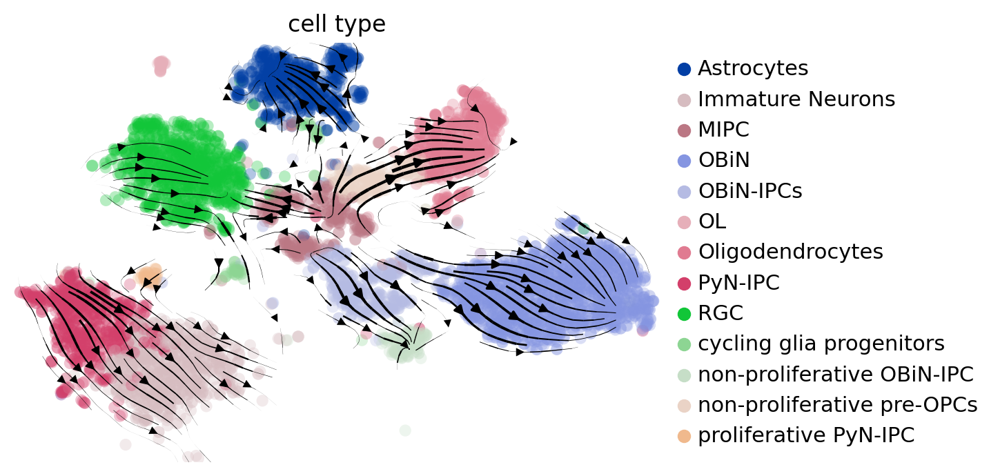

In [138]:
scv.pl.velocity_embedding_stream(adata, basis='tsne', color = 'cell_type', legend_loc='right margin')

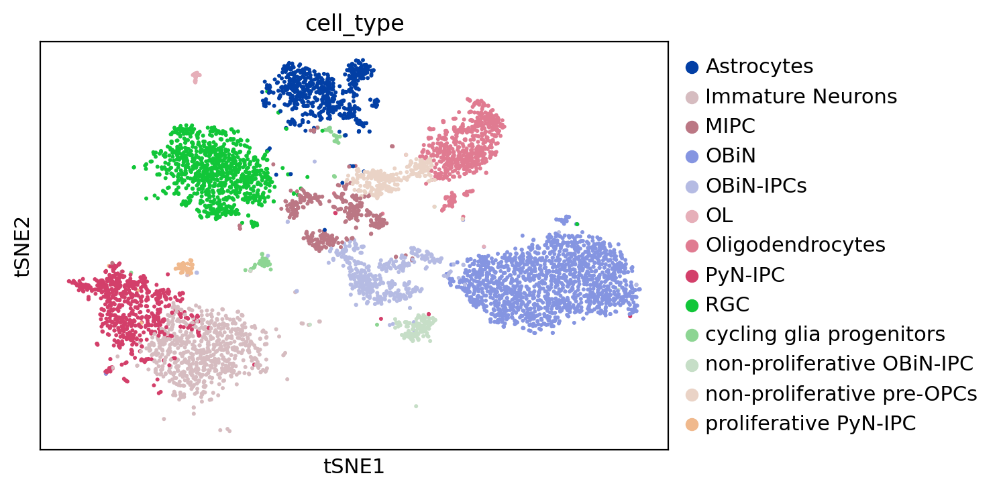

In [139]:
sc.pl.tsne(adata, color=['cell_type'])

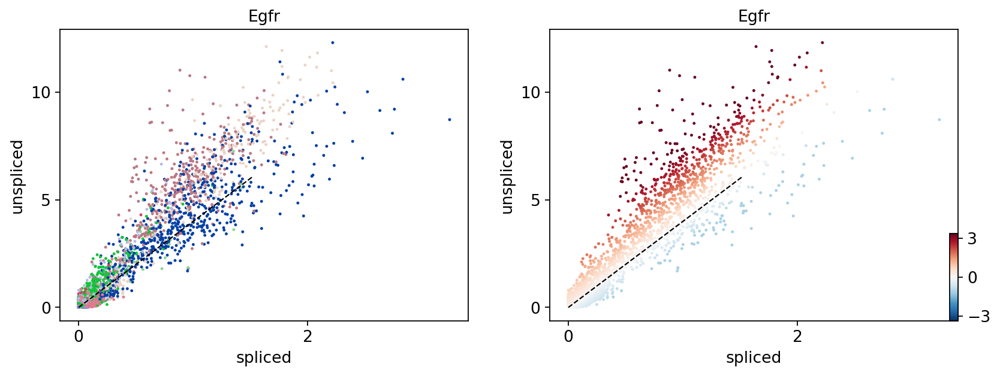

In [158]:
scv.pl.scatter(adata, 'Egfr', color=['cell_type', 'velocity'])


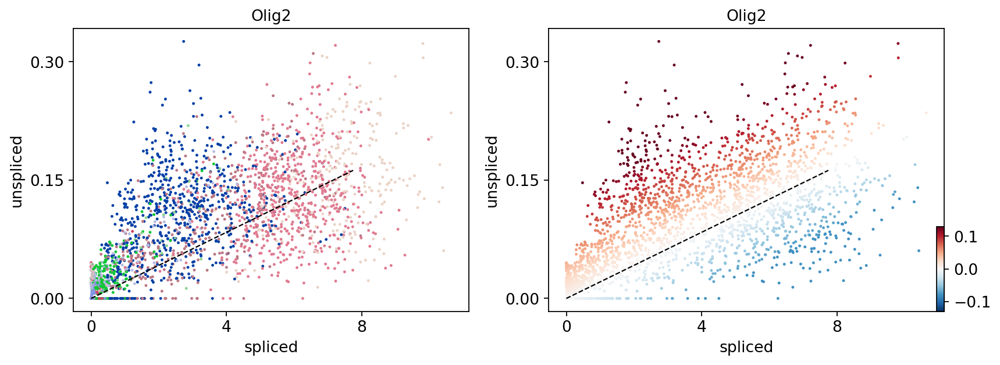

In [159]:
scv.pl.scatter(adata, 'Olig2', color=['cell_type', 'velocity'])

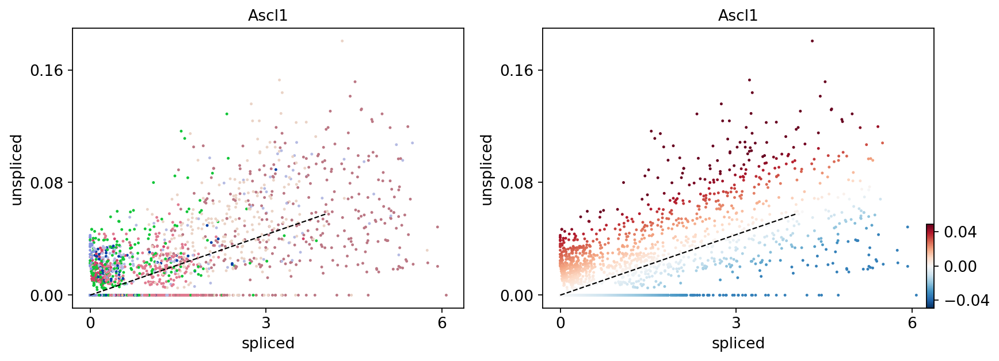

In [160]:
scv.pl.scatter(adata, 'Ascl1', color=['cell_type', 'velocity'])

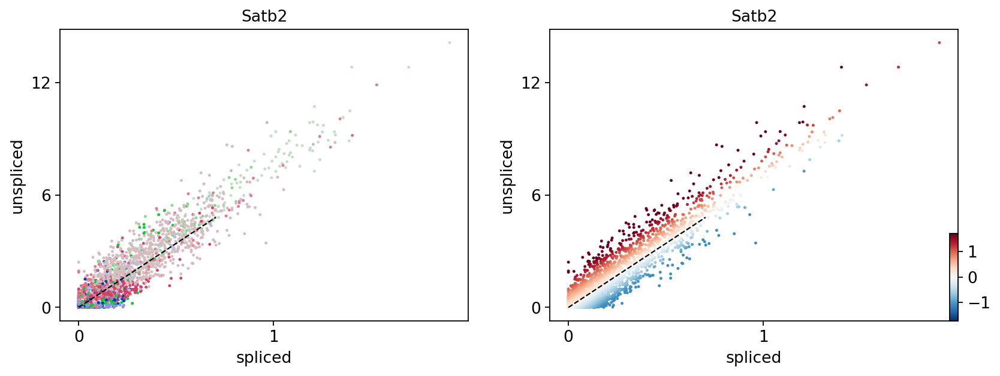

In [161]:
scv.pl.scatter(adata, 'Satb2', color=['cell_type', 'velocity'])

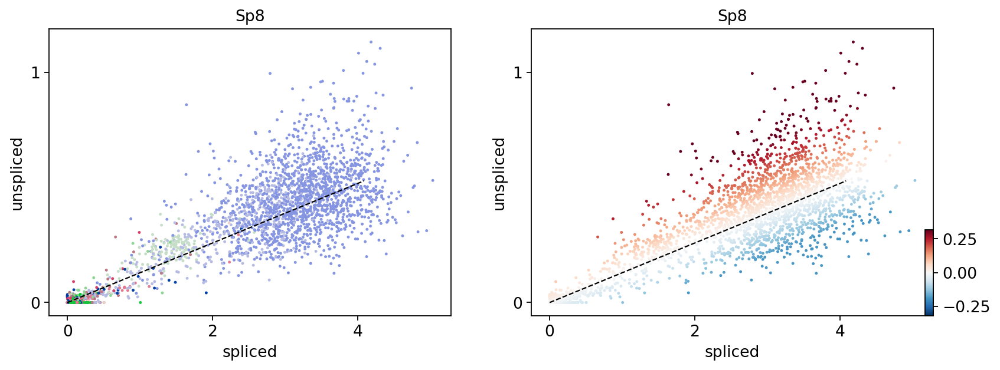

In [162]:
scv.pl.scatter(adata, 'Sp8', color=['cell_type', 'velocity'])

Trying to set attribute `._uns` of view, copying.


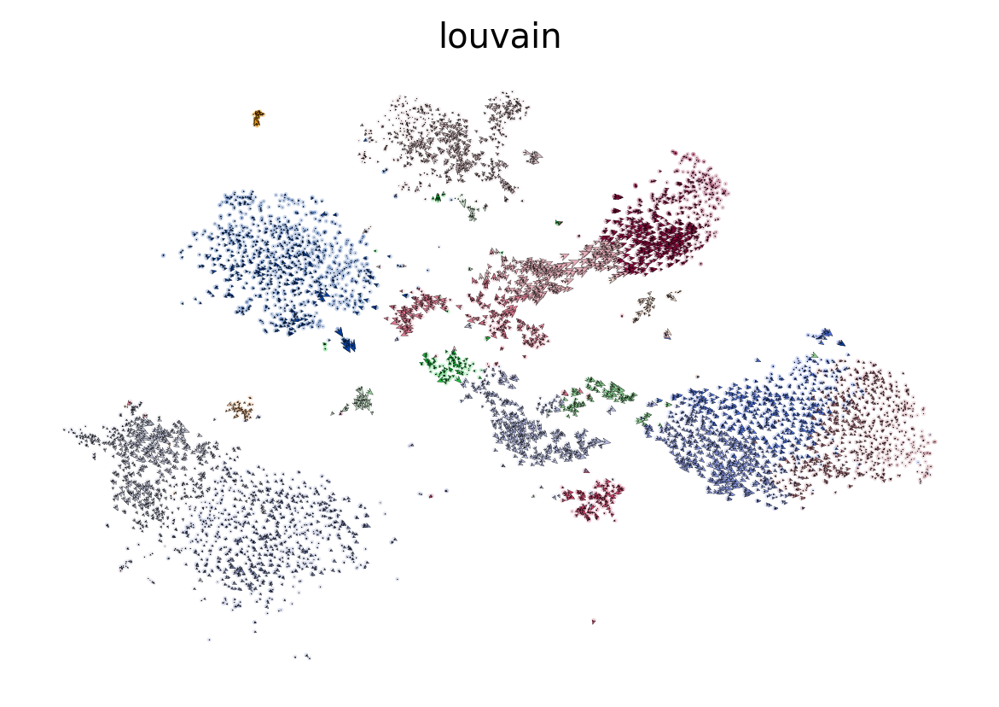

In [145]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120)

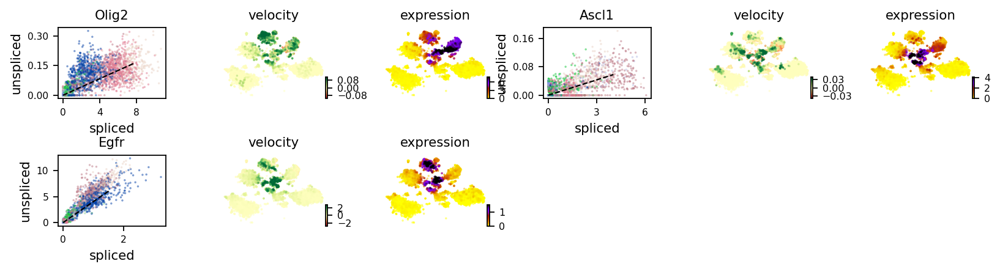

In [165]:
scv.pl.velocity(adata, ['Olig2', 'Ascl1', 'Egfr'], ncols=2, color=['cell_type'])

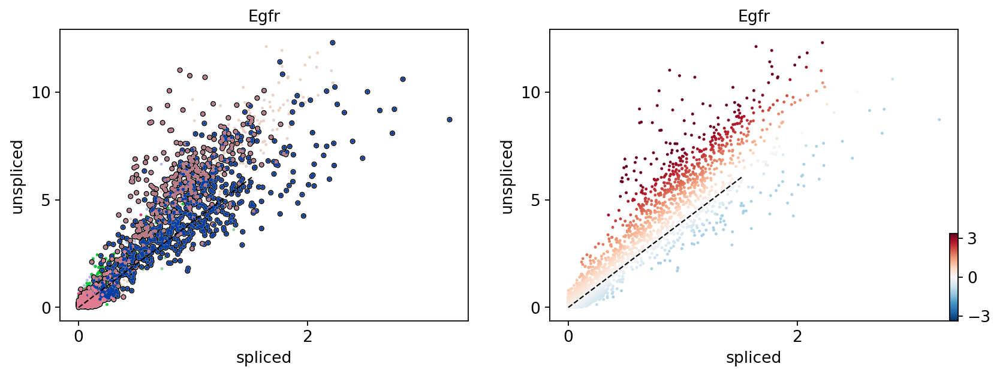

In [171]:
scv.pl.scatter(adata, 'Egfr', color=['cell_type', 'velocity'],
               add_outline='Astrocytes, MIPC, Oligodendrocytes')

In [147]:
adata

AnnData object with n_obs × n_vars = 6470 × 1275
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'rank_velocity_genes', 'louvain', 'cell_type_colors', 'louvain_colors'
    obsm: 'X_pca', 'X_tsne', 'velocity_tsne'
    varm: 'PCs'
    layers: 'a

In [152]:
adata.obs.cell_type

AAACCCAAGCGAGTCA                OBiN
AAACCCAAGGGATCGT                 RGC
AAACCCACACATGGTT                MIPC
AAACCCACAGTTCACA    Immature Neurons
AAACCCACATGTTCAG                 RGC
                          ...       
TTTGTTGGTGCTATTG                 RGC
TTTGTTGGTTGCTCCT                OBiN
TTTGTTGTCAACCCGG                OBiN
TTTGTTGTCCATCAGA                OBiN
TTTGTTGTCTCATTAC                OBiN
Name: cell_type, Length: 6470, dtype: category
Categories (13, object): ['Astrocytes', 'Immature Neurons', 'MIPC', 'OBiN', ..., 'cycling glia progenitors', 'non-proliferative OBiN-IPC', 'non-proliferative pre-OPCs', 'proliferative PyN-IPC']

In [153]:
scv.tl.rank_velocity_genes(adata, groupby='cell_type', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Astrocytes,Immature Neurons,MIPC,OBiN,OBiN-IPCs,OL,Oligodendrocytes,PyN-IPC,RGC,cycling glia progenitors,non-proliferative OBiN-IPC,non-proliferative pre-OPCs,proliferative PyN-IPC
0,Ptprm,Lsamp,Nfia,Pde4dip,Cemip2,Gas7,Sorcs3,Plcb1,Pcdh15,Gm26871,Adamts2,Rev3l,Ckap2
1,Gpm6b,Lrrtm4,Chd7,Robo2,Dleu2,Rbms1,Cdh13,Galnt17,Creb5,Shank1,Rnf150,Adgrl3,Igfbpl1
2,Rgs7,Slc8a1,Nfix,Slc4a4,Gm4258,Fign,Ppp2r2b,Cdh8,Ncald,Ldb2,D430041D05Rik,Gng12,Neil3
3,Adgrb3,Robo1,Zeb1,Ncam2,Nrxn3,Sox10,Lrp1b,Itpr1,Ntrk2,Opcml,9130024F11Rik,Dner,Dleu2
4,Qk,Osbpl6,Pon2,Kcnh8,Mpped2,Spock2,Sema6d,Tmem108,Epha4,Chl1,St8sia4,Ptprz1,Ckap2l


In [154]:
df

,Astrocytes,Immature Neurons,MIPC,OBiN,OBiN-IPCs,OL,Oligodendrocytes,PyN-IPC,RGC,cycling glia progenitors,non-proliferative OBiN-IPC,non-proliferative pre-OPCs,proliferative PyN-IPC
0,Ptprm,Lsamp,Nfia,Pde4dip,Cemip2,Gas7,Sorcs3,Plcb1,Pcdh15,Gm26871,Adamts2,Rev3l,Ckap2
1,Gpm6b,Lrrtm4,Chd7,Robo2,Dleu2,Rbms1,Cdh13,Galnt17,Creb5,Shank1,Rnf150,Adgrl3,Igfbpl1
2,Rgs7,Slc8a1,Nfix,Slc4a4,Gm4258,Fign,Ppp2r2b,Cdh8,Ncald,Ldb2,D430041D05Rik,Gng12,Neil3
3,Adgrb3,Robo1,Zeb1,Ncam2,Nrxn3,Sox10,Lrp1b,Itpr1,Ntrk2,Opcml,9130024F11Rik,Dner,Dleu2
4,Qk,Osbpl6,Pon2,Kcnh8,Mpped2,Spock2,Sema6d,Tmem108,Epha4,Chl1,St8sia4,Ptprz1,Ckap2l
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Specc1,Ly6h,Hpgd,Pbx3,Atp1b1,Zfp536,Cacng4,Ndst3,Col5a2,Negr1,Sorbs2,Sirpa,Slc7a1
96,Slc6a11,Plppr1,Rlbp1,Bcl11a,Gm17750,Maml2,Lrrtm3,Nnat,Ppp2r2b,Grk3,Khdrbs2,Ppp1r14c,Gpm6a
97,Grm5,Lypd6,Sgo1,Nrp2,Nnat,Mylip,Igsf9b,Rcor2,Hes1,Olig2,Ptx3,Tnr,Phgdh
98,Pea15a,Jph4,Rfx4,Kif26a,Ect2,Hmgcs1,Rab3c,Pou2f2,Scrn1,Cdh4,Ctsc,Tspan12,Cntn5


In [155]:
df.to_csv('scvelo_df_louvain_rank_velocity_genes.csv')

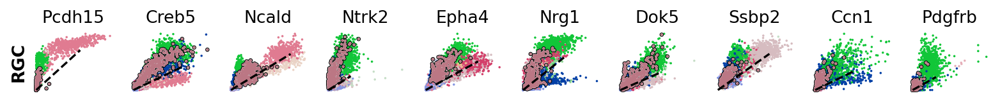

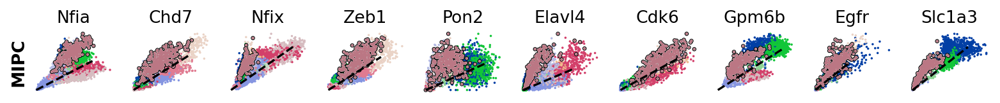

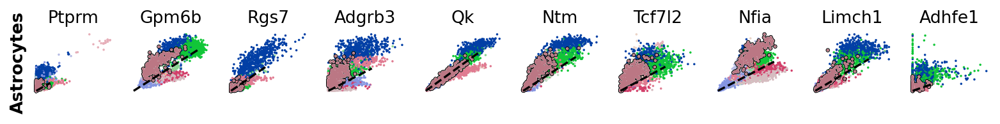

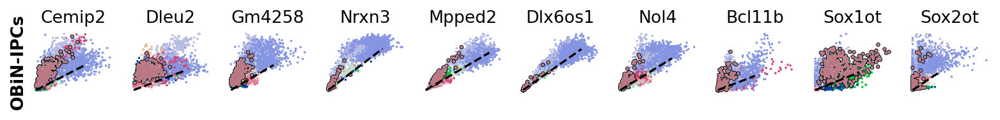

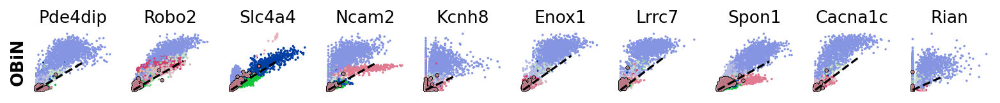

...

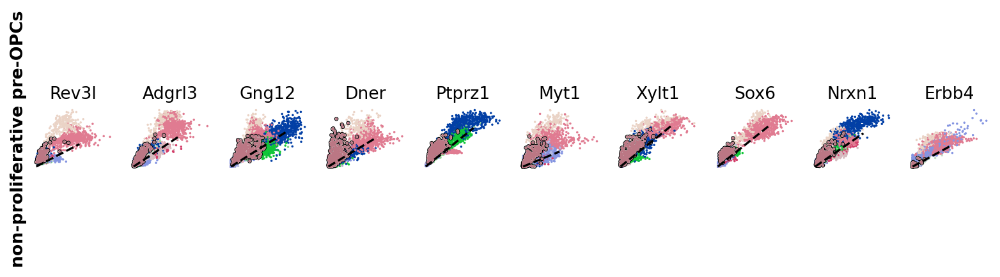

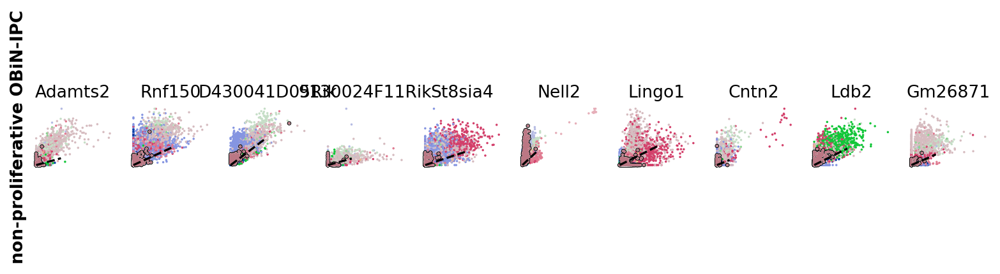

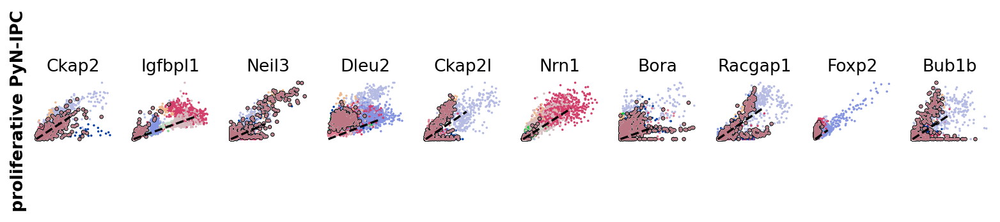

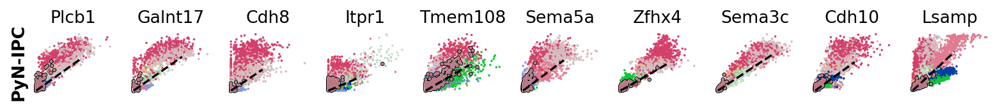

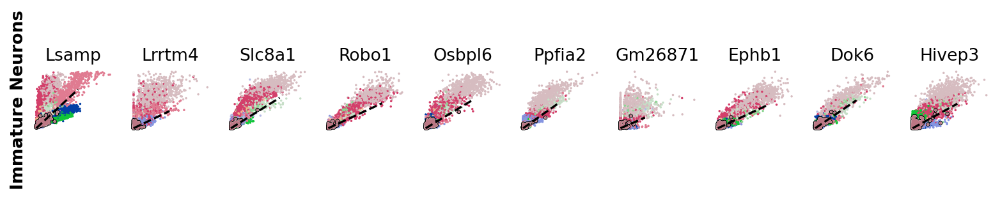

In [175]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='MIPC')

scv.pl.scatter(adata, df['RGC'][:10], ylabel='RGC', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['MIPC'][:10], ylabel='MIPC', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['Astrocytes'][:10], ylabel='Astrocytes',color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['OBiN-IPCs'][:10], ylabel='OBiN-IPCs', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['OBiN'][:10], ylabel='OBiN', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['Oligodendrocytes'][:10], ylabel='Oligodendrocytes',color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['OL'][:10], ylabel='OL', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['cycling glia progenitors'][:10], ylabel='cycling glia progenitors', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['non-proliferative pre-OPCs'][:10], ylabel='non-proliferative pre-OPCs',color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['non-proliferative OBiN-IPC'][:10], ylabel='non-proliferative OBiN-IPC', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['proliferative PyN-IPC'][:10], ylabel='proliferative PyN-IPC', color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['PyN-IPC'][:10], ylabel='PyN-IPC',color=['cell_type'], **kwargs)
scv.pl.scatter(adata, df['Immature Neurons'][:10], ylabel='Immature Neurons', color=['cell_type'], **kwargs)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


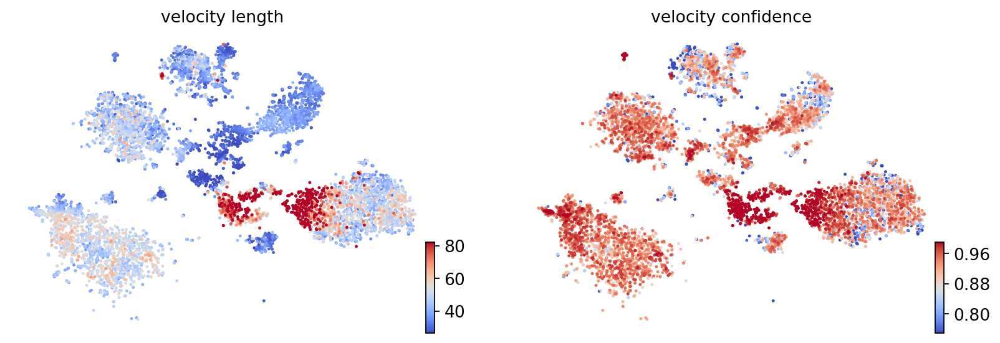

In [177]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [187]:
df = adata.obs.groupby('cell_type')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

cell_type,Astrocytes,Immature Neurons,MIPC,OBiN,OBiN-IPCs,OL,Oligodendrocytes,PyN-IPC,RGC,cycling glia progenitors,non-proliferative OBiN-IPC,non-proliferative pre-OPCs,proliferative PyN-IPC
velocity_length,37.310356,50.074791,29.985762,55.995201,68.160553,31.511999,34.721466,49.049431,43.380486,29.904478,31.959475,33.159962,38.823334
velocity_confidence,0.847749,0.931798,0.914007,0.900404,0.964943,0.955949,0.875094,0.942619,0.914339,0.762998,0.887446,0.936641,0.941711


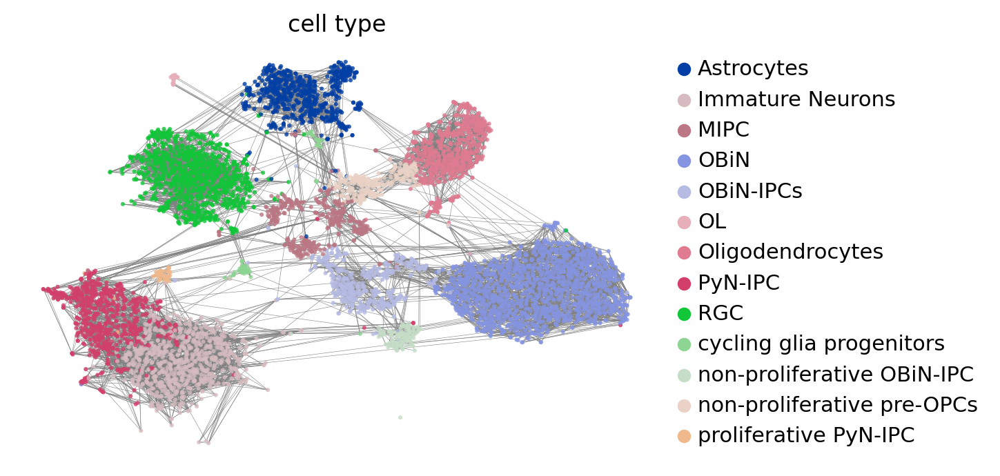

In [181]:
scv.pl.velocity_graph(adata, color=['cell_type'], threshold=.1, legend_loc='right margin')

In [7]:
# Show interactive plot using plotly. Please make sure that plotly is installed.

try:
    import plotly.express as px
    def plot(adata, embedding_key, cluster_column_name):
        embedding = adata.obsm[embedding_key]
        df = pd.DataFrame(embedding, columns=["x", "y"])
        df["cluster"] = adata.obs[cluster_column_name].values
        df["label"] = adata.obs.index.values
        fig = px.scatter(df, x="x", y="y", hover_name=df["label"], color="cluster")
        fig.show()

    plot(adata=pt.adata,
         embedding_key=pt.obsm_key,
         cluster_column_name=pt.cluster_column_name)
except:
    print("Plotly not found in your environment. Did you install plotly? Please read the instruction above.")


Plotly not found in your environment. Did you install plotly? Please read the instruction above.


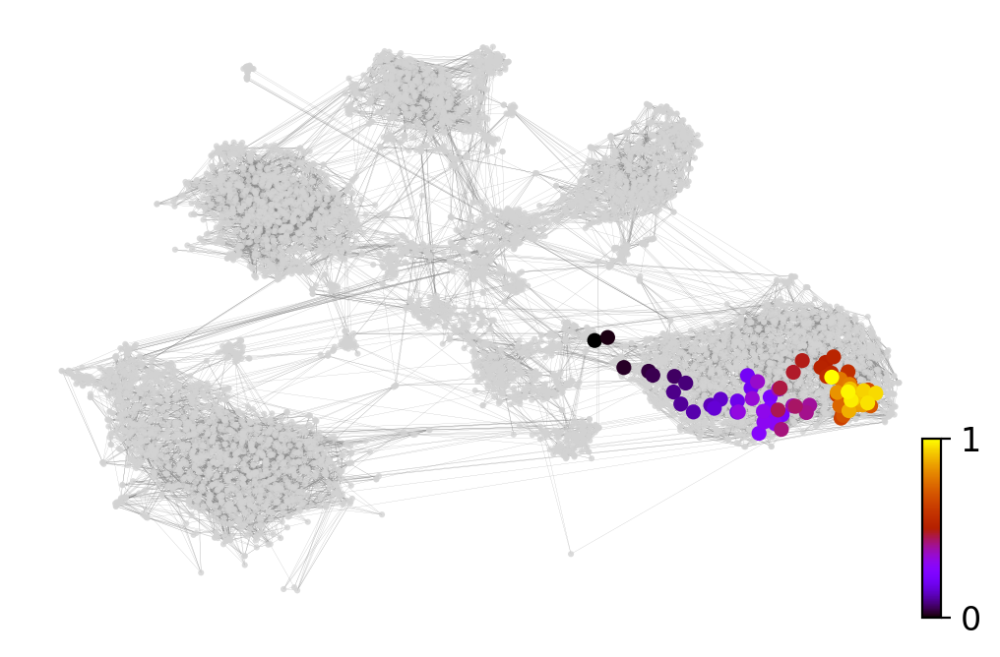

In [9]:
x, y = scv.utils.get_cell_transitions(adata, basis='tsne', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

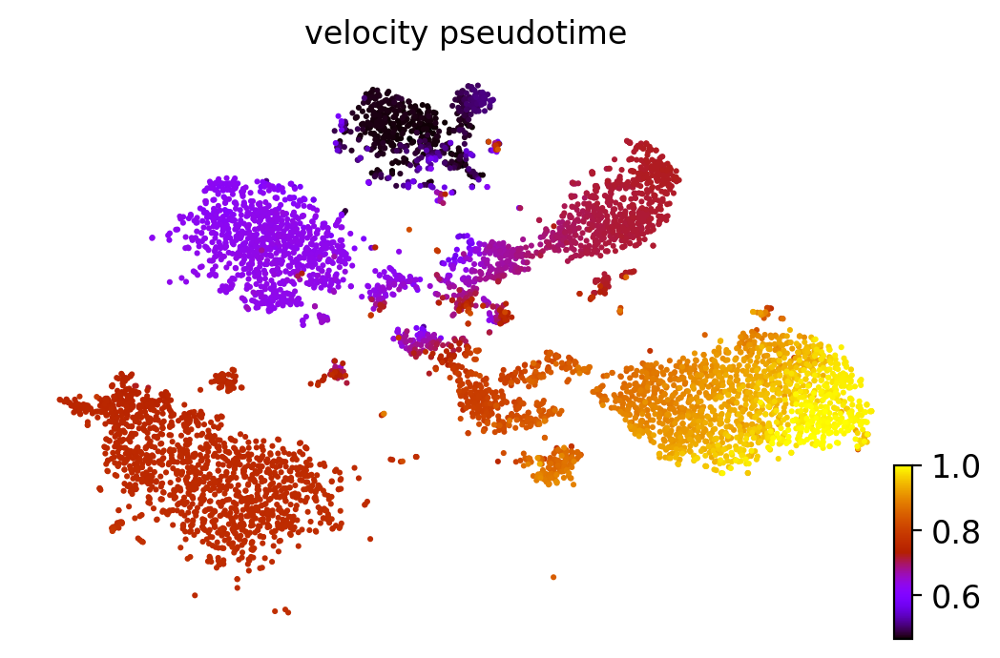

In [10]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [188]:
adata.write_h5ad("scrnaseq_rna_velocity.h5ad")

In [19]:
#PAGA RNA VELOCITY PLOT/GRAPH
#PAGA graph abstraction has benchmarked as top-performing method for trajectory inference. 
#It provides a graph-like map of the data topology with weighted edges corresponding to the connectivity between two clusters. 
#Here, PAGA is extended by velocity-inferred directionality.



# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='cell_type')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Astrocytes,Immature Neurons,MIPC,OBiN,OBiN-IPCs,OL,Oligodendrocytes,PyN-IPC,RGC,cycling glia progenitors,non-proliferative OBiN-IPC,non-proliferative pre-OPCs,proliferative PyN-IPC
Astrocytes,0,0,0.076,0,0,0,0,0,0.55,0,0,0,0
Immature Neurons,0,0,0,0,0,0,0,0,0,0,0,0,0
MIPC,0,0,0,0,0.45,0,0,0,0,0,0,0.46,0.064
OBiN,0,0,0,0,0,0,0,0,0,0,0,0,0
OBiN-IPCs,0,0,0,1.4,0,0,0,0,0,0,0.8,0,0
OL,0,0,0,0,0,0,0,0,0,0,0,0,0
Oligodendrocytes,0,0,0,0,0,0,0,0,0,0,0,0,0
PyN-IPC,0,2.1,0,0,0,0,0,0,0,0,0,0,0
RGC,0,0,0,0,0,0,0,0,0,0,0,0,0
cycling glia progenitors,0,0,0,0,0,0,0,0.64,0,0,0,0,0


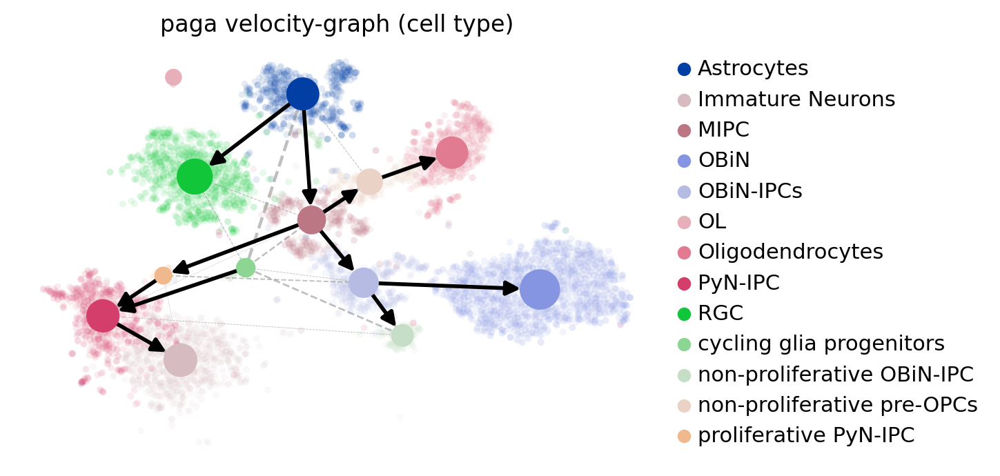

In [20]:
scv.pl.paga(adata, basis='tsne', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [21]:
#dynamic modeling rna velocity
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/24 cores)


  0%|          | 0/1086 [00:00<?, ?gene/s]

    finished (0:09:15) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [22]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing velocity graph (using 1/24 cores)


  0%|          | 0/6470 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [23]:
adata.write('scrnavelocity_dynamicmodeling.h5ad')

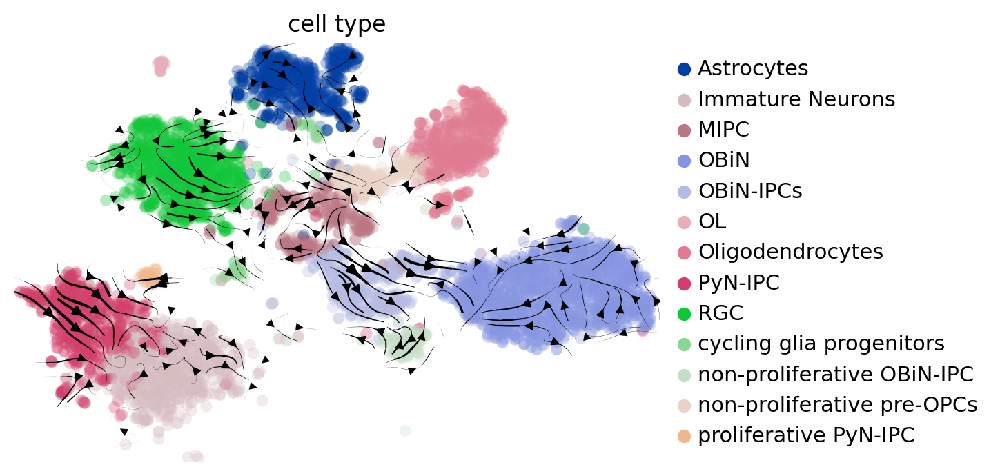

In [26]:
scv.pl.velocity_embedding_stream(adata, basis='tsne', color=['cell_type'], legend_loc='right margin')

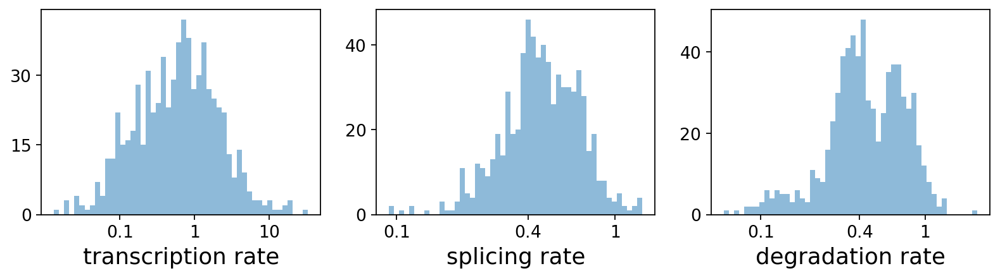

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Rgs20,0.37,0.06,0.25,13.33,2.65,1.98,0.35,0.49,0.0,0.0,0.45,5.65,1.02,0.23,2.79,0.93
St18,0.62,0.32,0.71,3.98,1.44,0.53,0.17,0.33,0.0,0.0,0.38,1.35,0.45,0.37,1.00,0.85
Adhfe1,0.01,0.02,0.07,22.62,10.11,0.15,0.02,0.18,0.0,0.0,0.28,0.40,0.08,0.70,6.01,0.07
Vxn,3.48,7.87,1.11,4.79,0.06,0.12,0.86,0.38,0.0,0.0,0.49,0.30,1.95,0.31,0.88,0.84
Prex2,0.11,0.16,0.37,6.41,3.84,0.29,0.08,0.28,0.0,0.0,0.04,0.66,0.20,0.59,1.76,0.78


In [27]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


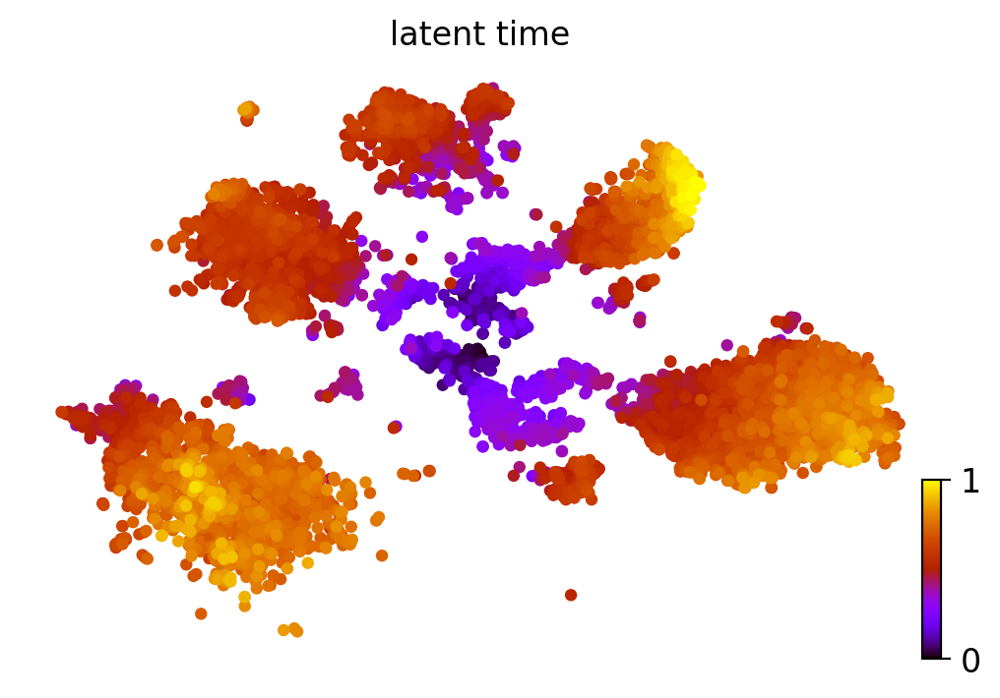

In [28]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

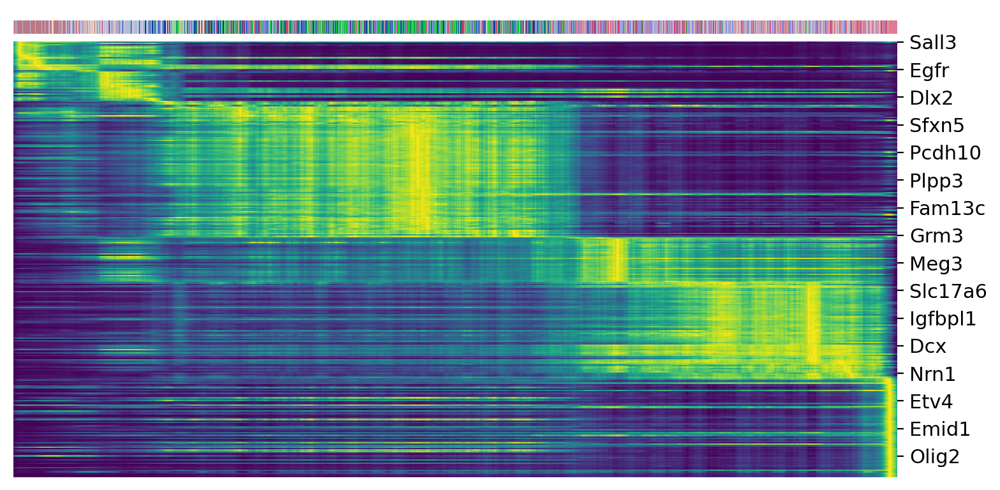

In [30]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='cell_type', n_convolve=100)

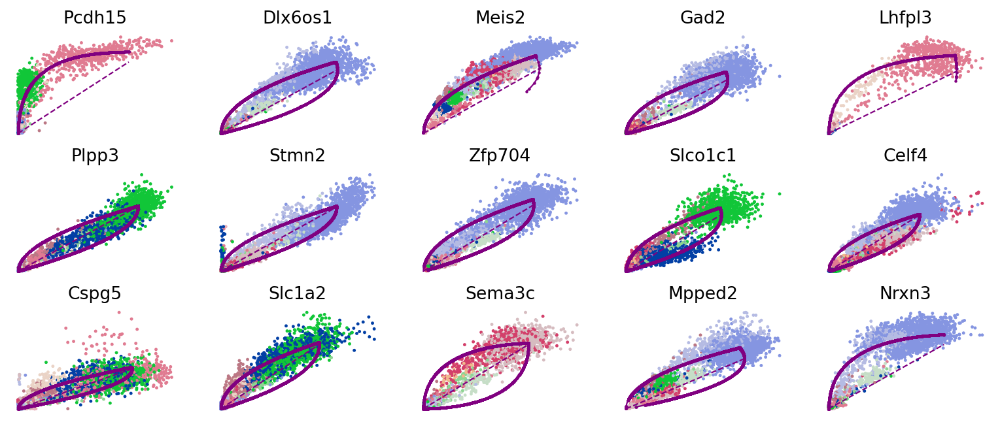

In [35]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], color=['cell_type'], ncols=5, frameon=False)

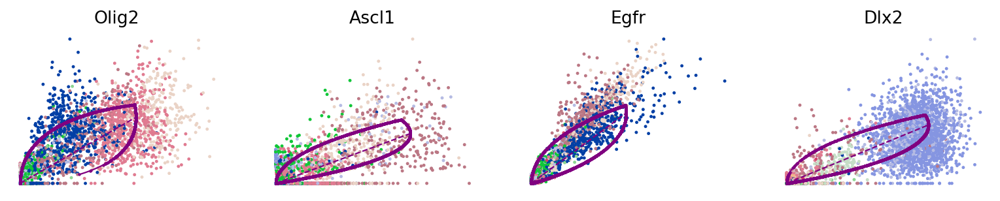

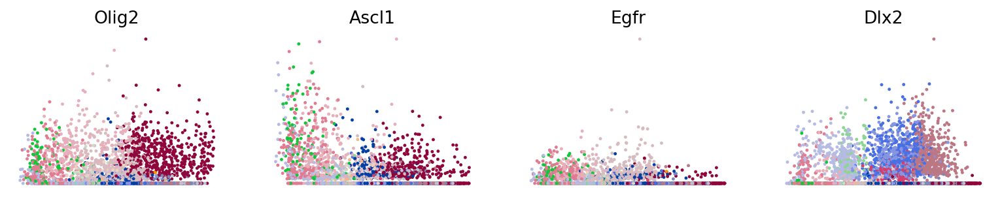

In [34]:
var_names = ['Olig2', 'Ascl1', 'Egfr', 'Dlx2']
scv.pl.scatter(adata, var_names, color = ['cell_type'], frameon=False)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False)


In [36]:
#Cluster-specific top-likelihood genes
#Moreover, partial gene likelihoods can be computed for a each cluster of cells to enable cluster-specific identification of potential drivers.

scv.tl.rank_dynamical_genes(adata, groupby='cell_type')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:04) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Astrocytes,Immature Neurons,MIPC,OBiN,OBiN-IPCs,OL,Oligodendrocytes,PyN-IPC,RGC,cycling glia progenitors,non-proliferative OBiN-IPC,non-proliferative pre-OPCs,proliferative PyN-IPC
0,Gnao1,Meis2,Slco1c1,Dlx6os1,Meis2,Frzb,Lhfpl3,Meis2,Meis2,Sfxn5,Dcx,Pdgfra,Meis2
1,Plpp3,Ttc28,Slc1a3,Gad2,Dlx6os1,Ctsh,Qk,Dcx,Qk,Notch2,Celf4,Bcas1,Ttc28
2,Cspg5,Celf4,Asrgl1,Igfbpl1,Nrxn3,Igf1,Pcdh15,Ttc28,Plpp3,Slco1c1,Plxna4,Cntn1,Srrm4
3,Mt3,Galnt17,Gnao1,Meis2,Celf4,Msi2,Sox10,Sema3c,Tspan7,Egln3,Stmn2,Gatm,Zfhx4
4,Sfxn5,Unc5d,Rgs20,Mpped2,Stmn2,Notch2,Csmd3,Unc5d,Cspg5,Dcx,Meis2,Cspg5,Rrm2
